# Manipulación básica de audio
Autor: Cristian Bautista

In [2]:
#Ejecutar en caso que las librerías no estén instaladas
!pip install librosa soundfile tqdm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 260.7/260.7 kB 3.9 MB/s eta 0:00:00 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 17.8 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 403.7/403.7 kB 34.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 32.6 MB/s eta 0:00:0000:0100:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.6/64.6 kB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 252.5/252.5 kB 26.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.4/42.4 MB 20.1 MB/s eta 0:00:0000:0100:01


In [3]:
import librosa
import numpy as np
import matplotlib.pyplot as plt
import librosa.display

# We'll need IPython.display's Audio widget
from IPython.display import Audio

#Para poder guardar en otros formatos (compresiones)
import soundfile as sf

import os
from tqdm import tqdm

In [4]:
#Importar otras librerías
from scipy.io import wavfile

# Carga de archivos y particularidades

In [7]:
#Cargar audio con scipy
# 1. Ruta del archivo
filename = "AudiosEx/TemaGuitarra.wav"
print(filename)

# 2. Cargar forma de audio en la variable "y2" frecuencia de muestreo "fs"
fs, y2 = wavfile.read(filename)
print("Frecuencia de muestreo:", fs)
print("Tipo de dato: ", y2.dtype)
print("Forma del vector original:", y2.shape)
#Es necesario reestructurar el vector sino hay error con la reproducción
y2 = y2.T
print("Forma del vector modficada:", y2.shape)
print(y2[:10])


# 3. Reproducir audio
Audio(data=y2, rate=fs)

AudiosEx/TemaGuitarra.wav
Frecuencia de muestreo: 44100
Tipo de dato:  int16
Forma del vector original: (1174824, 2)
Forma del vector modficada: (2, 1174824)
[[ 0  0  1 ...  5 -6 10]
 [ 1 -2  2 ...  0  3 -5]]


/tmp/ipykernel_244/1866743595.py:7: WavFileWarning: Chunk (non-data) not understood, skipping it.
  fs, y2 = wavfile.read(filename)


In [8]:
#Cargar audio con librosa
# 1. Ruta del archivo
filename = "AudiosEx/TemaGuitarra.wav"
print(filename)
 
# 2. Cargar forma de audio en la variable "y" frecuencia de muestreo "sr"
y, sr = librosa.load(filename, sr=None, mono=False) 
print("Frecuencia de muestreo:", sr)
print("Tipo de dato: ", y.dtype)
print("Forma del vector y:", y.shape)
print(y[:10])

# 3. Reproducir audio
Audio(data=y, rate=sr)

AudiosEx/TemaGuitarra.wav
Frecuencia de muestreo: 44100
Tipo de dato:  float32
Forma del vector y: (2, 1174824)
[[ 0.0000000e+00  0.0000000e+00  3.0517578e-05 ...  1.5258789e-04
  -1.8310547e-04  3.0517578e-04]
 [ 3.0517578e-05 -6.1035156e-05  6.1035156e-05 ...  0.0000000e+00
   9.1552734e-05 -1.5258789e-04]]


# Visualizar respuesta en el tiempo

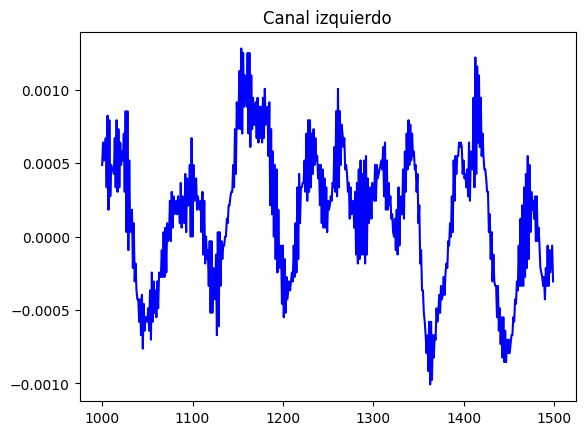

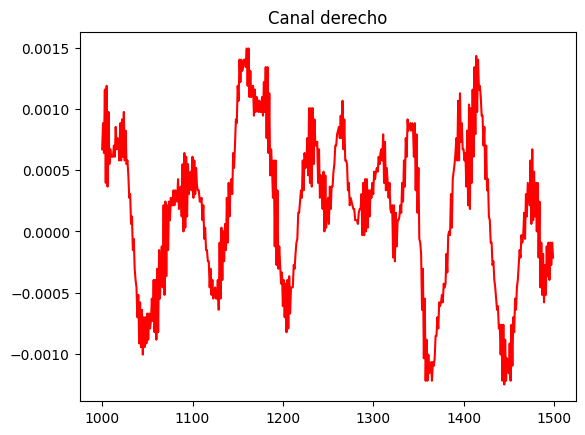

In [9]:
#Graficar
n=500 #Para determinar el número de muestras a graficar
offset=1000 #Para empezar de cualquier parte del vector
time=np.arange(offset,offset+n)
plt.title("Canal izquierdo")
plt.plot(time, y[0, offset:(offset+n)], color='b')
plt.show()

plt.title("Canal derecho")
plt.plot(time, y[1, offset:(offset+n)], color='r')
plt.show()

# Respuesta en frecuencia

In [10]:
#Cargar audio con librosa
# 1. Ruta del archivo
filename = "AudiosEx/NotaGuitarra.wav"
print(filename)
 
# 2. Cargar forma de audio en la variable "y" frecuencia de muestreo "sr"
nota, sr = librosa.load(filename, sr=None, mono=True) 

# 3. Reproducir audio
Audio(data=nota, rate=sr)

AudiosEx/NotaGuitarra.wav


In [11]:
# Calcular la FFT de la nota de guitarra
fft_result = np.fft.fft(nota)

# Obtener las magnitudes (espectro de amplitud)
magnitude = np.abs(fft_result)

# Frecuencias correspondientes (eje x)
freqs = np.fft.fftfreq(len(nota), 1/sr)

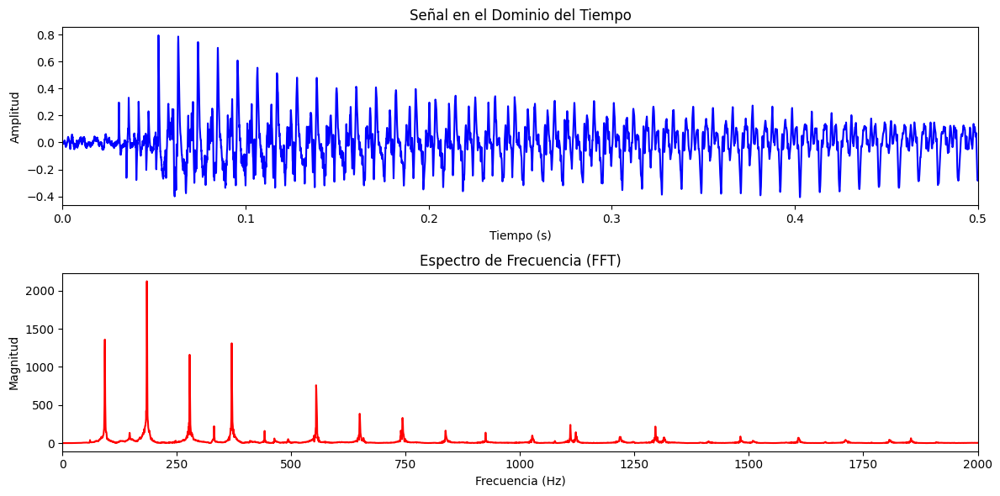

In [19]:
#Graficar respuesta en el tiempo y frecuencia de nota de guitarra
t = np.linspace(0, 1, sr)
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
plt.plot(t, nota[0:44100], color='b') #Pregunta al grupo: Porqué 44100?
plt.title("Señal en el Dominio del Tiempo")
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.xlim(0, 0.5)  # Mostrar solo los primeros 500ms
plt.subplot(2, 1, 2)
plt.plot(freqs[:len(freqs)//2], magnitude[:len(freqs)//2], color='r')  # Solo frecuencias positivas
plt.title("Espectro de Frecuencia (FFT)")
plt.xlabel("Frecuencia (Hz)")
plt.ylabel("Magnitud")
plt.xlim(0, 2000)  # Mostrar hasta 2 kHz (para ver los picos)
plt.tight_layout()
plt.show()

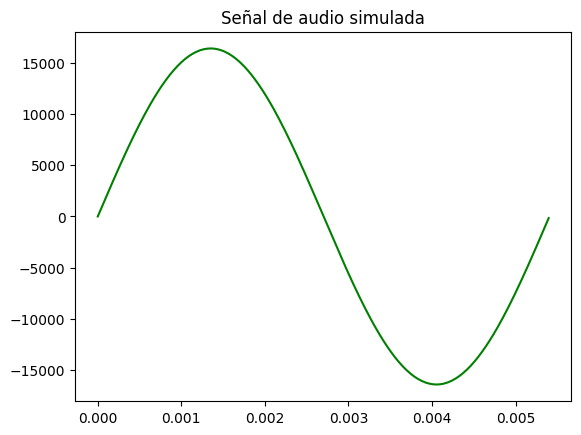

In [20]:
# Simular una señal int16 (rango válido)
n=239
sr = 44100
t = np.linspace(0, 1, sr)
sim = np.int16(32767 * 0.5 * np.sin(2 * np.pi * 185 * t))  # Señal sinusoidal 185Hz en int16
plt.title("Señal de audio simulada")
plt.plot(t[0:n], sim[0:n], color='g')
plt.show()

Audio(data=sim, rate=sr)

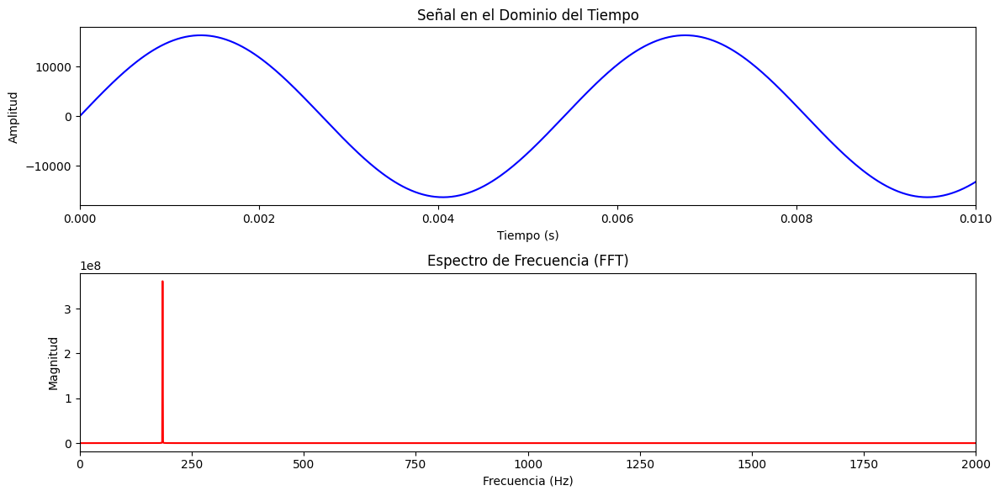

In [21]:
# Calcular la FFT de la nota sintetizada
fft_result = np.fft.fft(sim)

# Obtener las magnitudes (espectro de amplitud)
magnitude = np.abs(fft_result)

# Frecuencias correspondientes (eje x)
freqs = np.fft.fftfreq(len(sim), 1/sr)

#Graficar respuesta en el tiempo y frecuencia de nota de guitarra
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
plt.plot(t, sim, color='b') #Porqué ya no es necesario 
plt.title("Señal en el Dominio del Tiempo")
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.xlim(0, 0.01)  # Mostrar solo los primeros 10 ms
plt.subplot(2, 1, 2)
plt.plot(freqs[:len(freqs)//2], magnitude[:len(freqs)//2], color='r')  # Solo frecuencias positivas
plt.title("Espectro de Frecuencia (FFT)")
plt.xlabel("Frecuencia (Hz)")
plt.ylabel("Magnitud")
plt.xlim(0, 2000)  # Mostrar hasta 2 kHz (para ver los picos)
plt.tight_layout()
plt.show()

# Cambiar Frecuencia de muestreo Fs

In [47]:
sr_16=16000

y_16k = librosa.resample(y, orig_sr=sr, target_sr=sr_16)
print(y.shape, y_16k.shape)

Audio(data=y_16k, rate=sr_16)

(2, 1174824) (2, 426240)


# Cambiar tipos de compresión (formatos) y guardar archivos

In [48]:
y_16k = y_16k.T #Reorganizar vector para poder guardar audio stereo
print(y_16k.shape)
sf.write("Guitarra_16KHz.wav", y_16k, sr_16 )

(426240, 2)


In [49]:
# Guardar en otro formato (ej: WAV, FLAC, OGG)
#No es necesario reorganizar porque los audios son mono
print(nota.shape)
sf.write("audio_convertido.wav", nota, sr)  # WAV
sf.write("audio_convertido.flac", nota, sr)  # FLAC
sf.write("audio_convertido.ogg", nota, sr)  # OGG (requiere libsndfile)

(107369,)


# Funciones para modificar batches de audio en directorios

In [50]:
files=os.listdir("AudiosEx")
print(files)

['Resampled', '.ipynb_checkpoints', 'NotaGuitarra.wav', 'TemaGuitarra.mp3', 'TemaGuitarra.wav']


In [51]:
def t_resample(y, o_sr,t_sr,f):
    y_rs = librosa.resample(y, orig_sr=o_sr, target_sr=t_sr)
    sf.write('AudiosEx/resampled/'+'rs_'+f, y_rs, t_sr)

In [53]:
#Resample
target_sr=16000
for i in tqdm(range(len(files))):
    f = files[i]
    if os.path.isfile('AudiosEx/'+f):
        y, sr = librosa.load('AudiosEx/'+files[i], sr=None)
        t_resample(y,sr,target_sr,f)

100%|██████████| 5/5 [00:00<00:00,  9.64it/s]


## Ejercicios
1. Grábate diciendo sólo uno de tus nombres (1 seg aprox. un audio muy corto)
2. Graba un segundo tocando la puerta de tu casa
3. Graba un tercer sonido que tu quieras y consideres un sonido agudo (cantado, del entorno, etc.) (1 seg aprox).
4. Carga los audios y obten un gráfico útil de la respuesta en tiempo y frecuencia de los 3
5. Cambia la frecuencia de muestreo de todos a 16KHz.
6. Salva los audios en formato wav.

Reflexiona:
¿Notas alguna diferencia en los audios después de cambiar la Fs?
¿Comprendes cómo se compone la señal en frecuencia, su fundamental y armónicos?
Sube en el foro fotos de tus 6 gráficos (2 por cada audio, indica en el título qué sonido es) y comparte tus reflexiones para que el resto de los compañeros lo vea y pueda ser calificado.


# Funciones para aumento de datos

In [90]:
y_pitchs = librosa.effects.pitch_shift(y, sr=sr, n_steps=3) #-1.5,-3,1.5,3
y_16k = librosa.resample(y_pitchs, orig_sr=sr, target_sr=sr_16)
#sf.write('2-70052-B-42_16k.wav', y_16k, sr_16 )
Audio(data=y_pitchs, rate=sr)

In [59]:
y_fast = librosa.effects.time_stretch(y, rate=1.5) #0.7, 1.5
Audio(data=y_fast, rate=sr)

In [4]:
def t_stretch(y,f):
    y_s = librosa.effects.time_stretch(y, rate=1.5)
    sf.write('Audios/speed/'+'r_'+f, y_s, sr)
    y_s = librosa.effects.time_stretch(y, rate=0.7)
    sf.write('Audios/speed/'+'l_'+f, y_s, sr)

In [3]:
def t_pitch(y, sr, f):
    y_m15 = librosa.effects.pitch_shift(y, sr=sr, n_steps=-1.5)
    sf.write('Audios/pitch/'+'m15_'+f, y_m15, sr)
    y_m30 = librosa.effects.pitch_shift(y, sr=sr, n_steps=-3.0)
    sf.write('Audios/pitch/'+'m30_'+f, y_m30, sr)
    y_a15 = librosa.effects.pitch_shift(y, sr=sr, n_steps= 1.5)
    sf.write('Audios/pitch/'+'a15_'+f, y_a15, sr)
    y_a30 = librosa.effects.pitch_shift(y, sr=sr, n_steps= 3.0)
    sf.write('Audios/pitch/'+'a30_'+f, y_a30, sr)

In [5]:
def t_pitch_stretch(y, sr, f):
    y_m30 = librosa.effects.pitch_shift(y, sr=sr, n_steps=-3.0)
    y_s = librosa.effects.time_stretch(y_m30, rate=0.7)
    sf.write('Audios/pitch_speed/'+'lm_'+f, y_s, sr)
    y_s = librosa.effects.time_stretch(y_m30, rate=1.5)
    sf.write('Audios/pitch_speed/'+'rm_'+f, y_s, sr)
    
    y_a30 = librosa.effects.pitch_shift(y, sr=sr, n_steps=3.0)
    y_s = librosa.effects.time_stretch(y_a30, rate=0.7)
    sf.write('Audios/pitch_speed/'+'la_'+f, y_s, sr)
    y_s = librosa.effects.time_stretch(y_a30, rate=1.5)
    sf.write('Audios/pitch_speed/'+'ra_'+f, y_s, sr)

In [13]:
#Modify
for i in tqdm(range(len(files))):
    f = files[i]
    if os.path.isfile('Audios/'+f):
        y, sr = librosa.load('Audios/'+files[i], sr=16000)
        t_pitch(y,sr,f)
        t_stretch(y,f)
        t_pitch_stretch(y,sr,f)

100%|██████████████████████████████████████████████████████████████████████████████████| 74/74 [02:43<00:00,  2.21s/it]
